# Task 03 - Geospatial Analysis
Import Libraries

In [7]:
import pandas as pd
import folium
import matplotlib.pyplot as plt
import seaborn as sns
from folium.plugins import MarkerCluster

### *Choose Dataset from Local Directory*

In [8]:
from google.colab import files
uploaded = files.upload()

Saving Dataset .csv to Dataset .csv


Visualize Restaurant Locations on an Interactive Folium Map

In [ ]:
#street map view
df = pd.read_csv('Dataset .csv')
df = df[['Restaurant Name', 'Latitude', 'Longitude', 'City', 'Aggregate rating']]

df = df.dropna(subset=['Latitude', 'Longitude'])
map_center = [df['Latitude'].mean(), df['Longitude'].mean()]
restaurant_map = folium.Map(location=map_center, zoom_start=5)
marker_cluster = MarkerCluster().add_to(restaurant_map)

for _, row in df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"{row['Restaurant Name']}\nRating: {row['Aggregate rating']}",
        icon=folium.Icon(color="blue" if row['Aggregate rating'] >= 4 else "red")
    ).add_to(marker_cluster)

restaurant_map.save("restaurant_map.html")
restaurant_map

In [12]:
#satelite map view
df = pd.read_csv('Dataset .csv')

df = df[['Restaurant Name', 'Latitude', 'Longitude', 'City', 'Aggregate rating']]

df = df.dropna(subset=['Latitude', 'Longitude'])


df = df[(df['Longitude'] >= -180) & (df['Longitude'] <= 180)]

map_center = [df['Latitude'].median(), df['Longitude'].median()]

restaurant_map = folium.Map(
    location=map_center,
    zoom_start=5,
    tiles="https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}",
    attr="Esri"
)


marker_cluster = MarkerCluster().add_to(restaurant_map)

for _, row in df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"{row['Restaurant Name']}\nRating: {row['Aggregate rating']}",
        icon=folium.Icon(color="blue" if row['Aggregate rating'] >= 4 else "red")
    ).add_to(marker_cluster)

restaurant_map.save("restaurant_map.html")
restaurant_map


Distribution of Restaurants Across Cities

<ipython-input-16-2b96efdff8ba>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_cities.index, y=top_cities.values, palette='coolwarm')


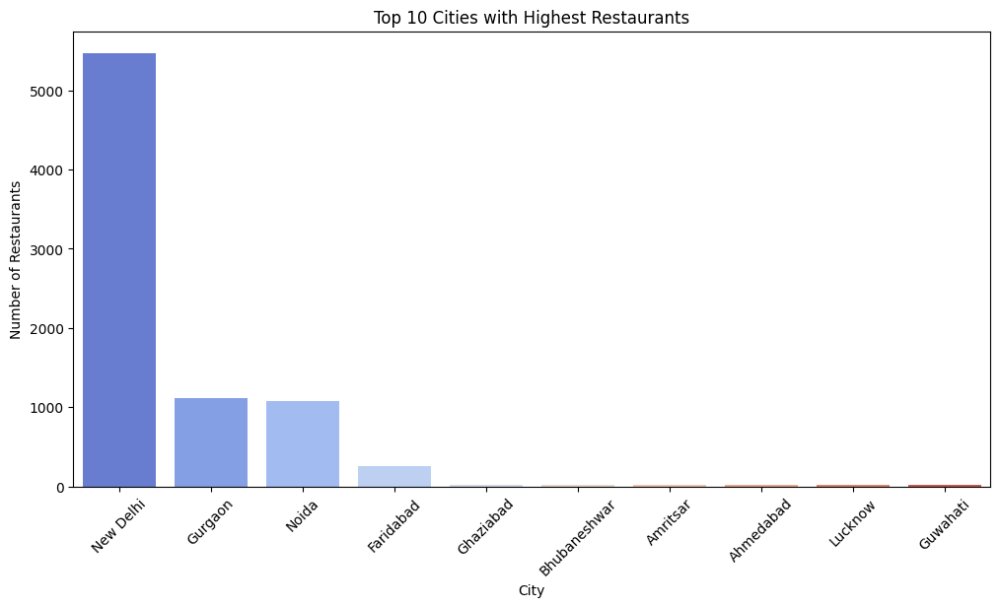

In [16]:
plt.figure(figsize=(12, 6))
top_cities = df['City'].value_counts().nlargest(10)
sns.barplot(x=top_cities.index, y=top_cities.values, palette='coolwarm')
plt.xticks(rotation=45)
plt.xlabel("City")
plt.ylabel("Number of Restaurants")
plt.title("Top 10 Cities with Highest Restaurants")
plt.show()

Correlation between Restaurant Location and Rating

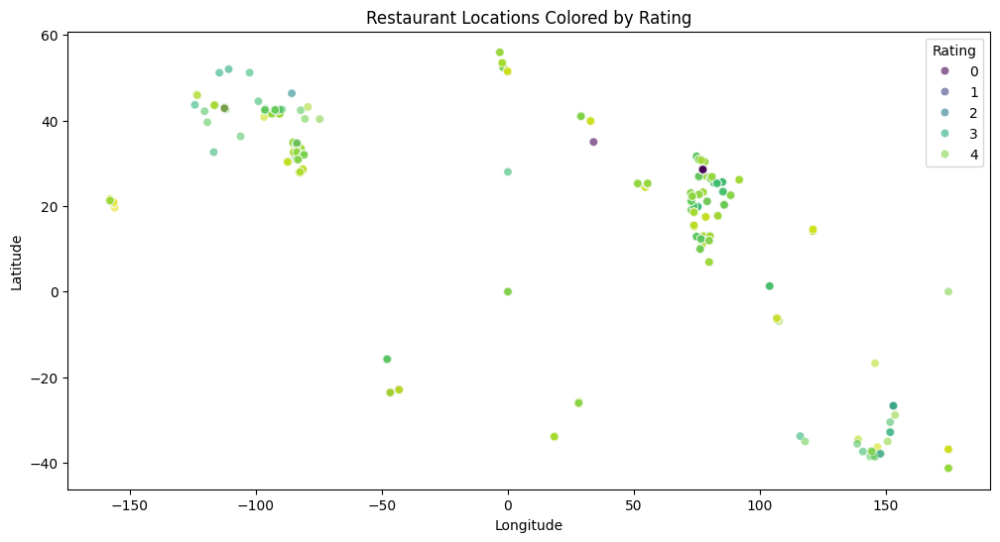

In [18]:
plt.figure(figsize=(12, 6))
sns.scatterplot(x=df['Longitude'], y=df['Latitude'], hue=df['Aggregate rating'], palette='viridis', alpha=0.6)
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Restaurant Locations Colored by Rating")
plt.legend(title="Rating")
plt.show()